# Рынок заведений общественного питания Москвы

В качестве входных данных для исследования поступил датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

Исходный датафрейм содержит информацию о местоположении заведений, об их категории, режиме работы, рейтинге,  районе, количестве посадочных мест, а также значения среднего чека заказа, среднюю стоимость чашки капучино и отметку о принадлежности заведения к сети.

**Цель исследования**: подготовить анализ рынка заведений общественного питания Москвы, найти интересные особенности, которые в будущем помогут в выборе подходящего для старта нового бизнеса места.

**Задачи исследования**:

- проанализировать заведения из датасета в разрезе категорий;
- изучить соотношение сетевых и несетевых заведений;
- изучить особенности местоположения различных объектов общепита из датасета;
- определить как различаются суммы средних чеков по районам;
- изучить особенности московских кофеен, определить оптимальное местоположение для открытия новой кофейни.

**ПЛАН ИССЛЕДОВАНИЯ**:
1. Знакомство с данными и подготовка их к дальнейшему анализу
2. Исследовательский анализ данных
3. Анализ рынка кофеен в Москве
5. Общие вывод по проекту в виде презентации

## 1. Знакомство с данными и подготовка их к дальнейшему анализу

Для старта работы с данными загрузим все необходимые для этого библиотеки:

In [1]:
import pandas as pd # импортируем pandas для работы с таблицами

import numpy as np # импортируем библиотеку numpy для работы с массивами

from matplotlib import pyplot as plt # импортируем библиотеку pyplot для работы с графиками

import seaborn as sns # импортируем библиотеку seaborn для работы с инструментами визуализации

from plotly import graph_objects as go # импортируем библиотеку plotly.express для работы с инструментами 
#визуализации

import folium # импортируем библиотеку folium для визуализации данных на карте

import json # импортируем библиотеку json для работы с файлами JSON формата

from folium import Map, Choropleth, Marker # импортируем инструменты визуализации Map и Choropleth 
# из библиотеки folium

from folium.plugins import MarkerCluster # импортируем инструменты визуализации MarkerCluster

###  1.1 Загрузка данных

Считаем информацию из файла, предоставленного для исследования. Полученный датафрейм назовем places и выведем его первые пять строк:

In [2]:
places = pd.read_csv('moscow_places.csv')
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Изучим общую информацию о датафрейме events, используя метод info.

In [3]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Итак, всего в датафрейме 8406 строк. Таблица хранит информацию о заведениях общественного питания в разрезе 13 разных измерений: название, тип заведения, адрес, район, график работы, географические широта и долгота, на которых находится заведение, рейтинг, категория цен, средний чек, средняя стоимость чашки капучино, относится ли заведение к сети или нет, количество посадочных мест. 


Большинство столбцов несут в себе информацию в формате object, так как они содержат категориальные данные. Числовые данные содержатся только в столцах с географическими координатами заведений, средним чеком(middle_avg_bill), средней стоимостью чашки кофе и с количеством посадочных мест. 

Оформление таблицы соответсвует правилам хорошего стиля. Изменение типов данных не потребуется.

### 1.2 Предобработка данных

#### 1.2.1 Обработка дубликатов

Проверим массив на наличие явных дубликатов:

In [4]:
places.duplicated().sum()

0

Явных дубликатов в исходном датафрейме не обнаружено. 

Поищем неявные дубликаты. Для этого проверим, есть ли повторения строк с одинаковым названием заведения и адресом.

In [5]:
places[['name', 'address']] = places[['name', 'address']].apply(lambda x: x.str.lower())
print('Дубликатов:', places.duplicated(subset=['name', 'address']).sum())

Дубликатов: 4


Найдено четыре дубликата. Удалим их:

In [6]:
places = places.drop_duplicates(subset = ['name', 'address'])

#### 1.2.3 Обработка пропущенных значений

Посмотрим, есть ли в таблице пропущенные значения и сколько их в каждом столбце.

In [7]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Пропуски встречаются в 6 разных столбцах.

Посчитаем доли пропущенных строк в каждом столбце  с пропусками:

In [8]:
for column in places:
    
    if places[column].isna().sum()>0:
        
        print(f'Доля пропущенных значений в столбце {column}:\
{(places[column].isna().sum()/len(places)*100).round(2)}%')

Доля пропущенных значений в столбце hours:6.37%
Доля пропущенных значений в столбце price:60.55%
Доля пропущенных значений в столбце avg_bill:54.58%
Доля пропущенных значений в столбце middle_avg_bill:62.52%
Доля пропущенных значений в столбце middle_coffee_cup:93.63%
Доля пропущенных значений в столбце seats:42.97%


Итак, доли пропущенных значений очень высоки во всех столбцах, кроме доли в столбце hours - количество пропущенных значений в этом столбце не превышает 6,5% . Удалим строки с пропусками в столбце hours:

In [9]:
places = places.dropna(subset=['hours'])

Вызовем повторно метод isna, чтобы проверить количество пропусков в таблице:

In [10]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                4557
avg_bill             4059
middle_avg_bill      4724
middle_coffee_cup    7333
chain                   0
seats                3374
dtype: int64

Пропуски остались в столбцах с ценовой категорией заведения, со средней стоимостью заказа, размером среднего чека, со средней стоимостью чашки кофе и с количеством посадочных мест в заведении. 

Попробуем заполнить часть пропусков в столбце с ценовой категорией заведения.

Для этого посмотрим, в каком ценовом диапазоне находится средний чек заведений из разных категорий:

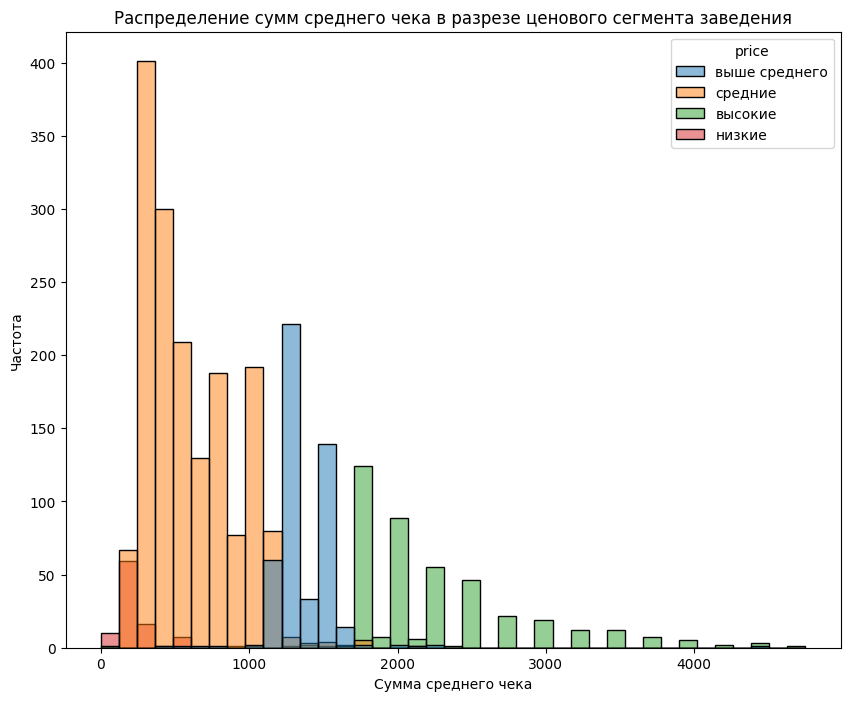

In [11]:
plt. figure(figsize=(10, 8))
sns.histplot(data=places[places['middle_avg_bill']<5000], x='middle_avg_bill', hue='price') # построим гистограмму
# распределения сумм среднего чека в разрезе ценового сегмента заведения, ограничив сумму чека 5000 
plt.title('Распределение сумм среднего чека в разрезе ценового сегмента заведения')
plt.xlabel('Сумма среднего чека')
plt.ylabel('Частота')
plt.show()

По гистограмме видно, что каждой ценовой категории заведения соответствует свой диапазон сумм среднего чека. Построим сводную таблицу для определения границ величины среднего чека для заведений из разных ценовых сегментов: 

In [12]:
def percentile_95th(x):
    return np.percentile(x, 95) # сначала напишем функцию для расчета 95-ого перцентиля 

places.dropna(subset =['middle_avg_bill']).pivot_table(
    index='price', values='middle_avg_bill', aggfunc=['min', 'max', percentile_95th]) # теперь построим сводную 
# таблицу, сгруппировав данные по ценовому сегменту и рассчитав минимальное и максимальное значение среднего чека 
#  для заведений, а также 95-ый перцентиль этой величины

,min,max,percentile_95th
,middle_avg_bill,middle_avg_bill,middle_avg_bill
price,,,
высокие,0.0,35000.0,4250.0
выше среднего,375.0,4500.0,1550.0
низкие,90.0,600.0,510.0
средние,165.0,2150.0,1100.0


Видно, что нижняя граница среднего чека для разных сегментов сильно варьируется. Поэтому определять диапазон среднего чека для замены пропусков в столбце price будем по 95 перцентилю среднего чека в категории. Так, заполним пропуски следующими значениями:

- "низкие" для middle_avg_bill<= 510,
- "средние" для 510 <middle_avg_bill <=1100,
- "выше среднего" для 1100 <middle_avg_bill <=1550,
- "высокие" для  middle_avg_bill>1550

Выберем пустые строки, где ячейки в столбце price пустые, но при этом присутствует значение среднего чека, входящее в определенный интервал. Заполним пропуски. 

In [13]:
places.loc[places.price.isna() & places.middle_avg_bill.notna()\
           & places.middle_avg_bill.between(0,510), 'price'] = 'низкие'
places.loc[places.price.isna() & places.middle_avg_bill.notna() \
           & places.middle_avg_bill.between(510,1100), 'price'] = 'средние'
places.loc[places.price.isna() & places.middle_avg_bill.notna() \
           & places.middle_avg_bill.between(1100,1550), 'price'] = 'выше среднего'
places.loc[places.price.isna() & places.middle_avg_bill.notna() \
           & places.middle_avg_bill.between(1550,np.inf), 'price'] = 'высокие'

places

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,низкие,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Проверим наличие пропусков в столбце price после наших корректировок:

In [14]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                4090
avg_bill             4059
middle_avg_bill      4724
middle_coffee_cup    7333
chain                   0
seats                3374
dtype: int64

Таким образом в столбце price было заполнено 467  пропусков.

Теперь проверим, для всех ли значений из столбца avg_bill, начинающихся с подстроки "Средний счёт", есть соответствия в столбце middle_avg_bill. 

In [15]:
places.loc[places['avg_bill'].str.contains('Средний счёт', case=False, na=False), 'middle_avg_bill'].isna().sum() 

0

Для всех значений столбца avg_bill, начинающихся с подстроки "Средний счёт", есть соответствия в столбце middle_avg_bill.

Теперь проведем обратную проверку и узнаем, для всех ли непропущенных значений в столбце middle_avg_bill есть соответствия в столбце avg_bill:

In [16]:
places.loc[places['middle_avg_bill'].notnull(), 'avg_bill'].isna().sum()

0

Для всех непропущенных значений столбца middle_avg_bill есть соответствия в столбце avg_bill.

Проверим, для всех ли значений из столбца avg_bill, начинающихся с подстроки "Цена одной чашки капучино", есть соответствия в столбце middle_coffee_cup. 

In [17]:
places.loc[
    places['avg_bill'].str.contains('Цена одной чашки капучино', case=False, na=False), 'middle_coffee_cup'
].isna().sum() 

0

Для всех значений столбца avg_bill, начинающихся с подстроки "Цена одной чашки капучино", есть соответствия в столбце middle_coffee_cup.

Таким образом, делаем вывод, что пропуски в столбцах avg_bill, middle_avg_bill и middle_coffee_cup объяснены отсутствием соответствующей информации. Заполнить мы их не можем, поэтому оставим как есть.

Рассмотрим теперь пропуски в стобце seats. Попробуем выявить взаимосвязь количества посадочных мест с типом (категорией) заведения. Посмотрим гистограмму распределения количества посадочных мест для разных типов заведений.

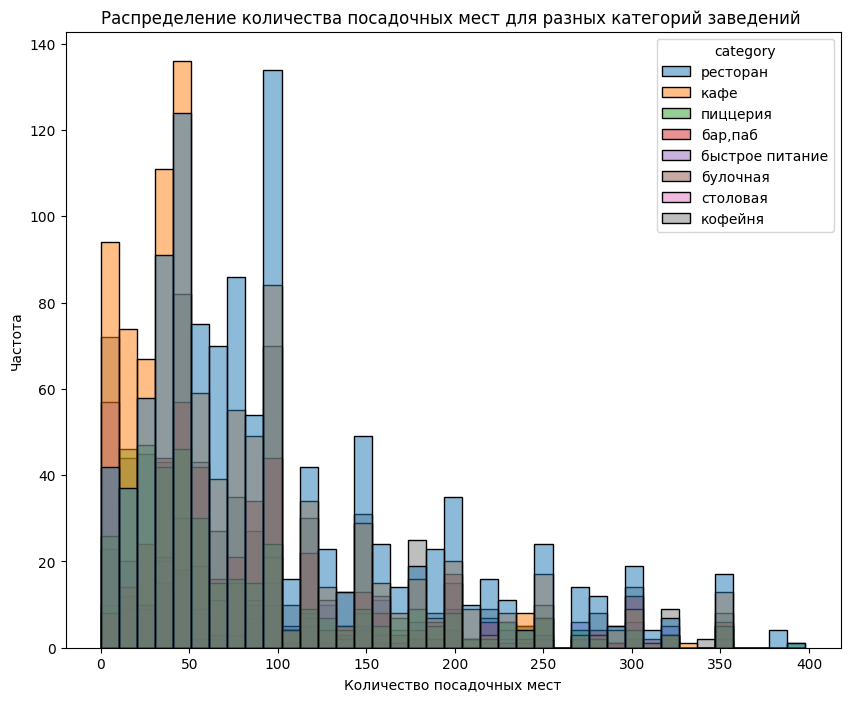

In [18]:
plt. figure(figsize=(10, 8))
sns.histplot(data=places[places['seats']<400], x='seats', hue='category') # построим гистограмму
# распределения количества посадочных мест в разрезе категории заведения, ограничив количество посадочных мест 400 
plt.title('Распределение количества посадочных мест для разных категорий заведений ')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Частота')
plt.show()

По гистограмме видно, что разным видам заведений соответсвует абсолютно разное количество посадочных мест, нет какой-то общей тенденции. Таким образом, мы не можем определить какими значениями заполнить пропуски в столбце seats. Поэтому, во избежание искажения данных, оставим пропущенные значения в этом столбце нетронутыми.

### 1.3 Создание вспомогательных столбцов

Добавим пару столбцов с недостающей информацией в наш исходный датафрейм. Для дальнейшего анализа нам понадобится знать улицу, на которой находится заведение, и заведения, график работы которых 24 на 7. Выделим эти характеристики в столбцы street и is_24_7 соответственно. 

Создаем столбец **street**:

In [19]:
places['street'] = places['address'].apply(lambda x: x.split(', ')[1])
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


Создаем столбец **is_24_7**. Заведения, работающие 7 дней в неделю круглосуточно, должны содержать пометку "ежедневно, круглосуточно" в столбце hours.

In [20]:
places['is_24_7'] = places['hours'].str.contains('ежедневно, круглосуточно', case=False, na=False)

### Вывод:

Оформление таблицы соответсвует правилам хорошего стиля. Изменение типов данных не потребовалось.

В ходе проверки данных на наличие дубликатов, было обнаружено 3 неявных дубликата. Было принято решение их удалить.

Проверка датафрейма на наличие пропусков показала, что пропуски имеются в 6 столбцах. В столбце hours было всего 535 пропусков, это менее 6,5% от общего объема данных. Строки с пропусками в этом столбце было принято решение удалить. 

В других столбцах (price, avg_bill,middle_avg_bill, middle_coffee_cup, middle_coffee_cup, seats) количество пропусков превышало 40% от общего количества строк в таблице. В столбце price часть пропусков было принято решение заполнить значениями, определенными на основании данных из столбца с размером среднего чека заведения - так было заполнено 467 пропусков.

В других столбцах заполнить пропуски не удалось. В ходе анализа было определено, что наличие пропусков в них закономерно, и данных для их заполнения у нас нет. 

Изначально в датафрейме было 8406 строк. В ходе предобработки было удалено 538 строк (около 6,5% от исходного объема данных).

Также в ходе предобработки в начальный датафрейм были добавлены столбцы с дополнительной информацией, которая в потребуется нам для дальнейшего анализа: street - с названием улицы, на которой находится заведение, и is_24_7 - с отметкой о том, является ли заведение круглосуточным.

## 2. Исследовательский анализ данных

### 2.1 Анализ заведений по категориям

Посмотрим, какие категории заведений представлены в данных.

In [21]:
places['category'].value_counts().reset_index()

,category,count
0,кафе,2002
1,ресторан,1968
2,кофейня,1398
3,"бар,паб",746
4,пиццерия,628
5,быстрое питание,570
6,столовая,306
7,булочная,249


Всего представлено 7 категорий: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная. 

Наиболее многочисленная категория - кафе, их в нашем массиве 2003. 

Построим столбцатую диаграмму, чтобы наглядно показать различия в количестве заведений разных типов.

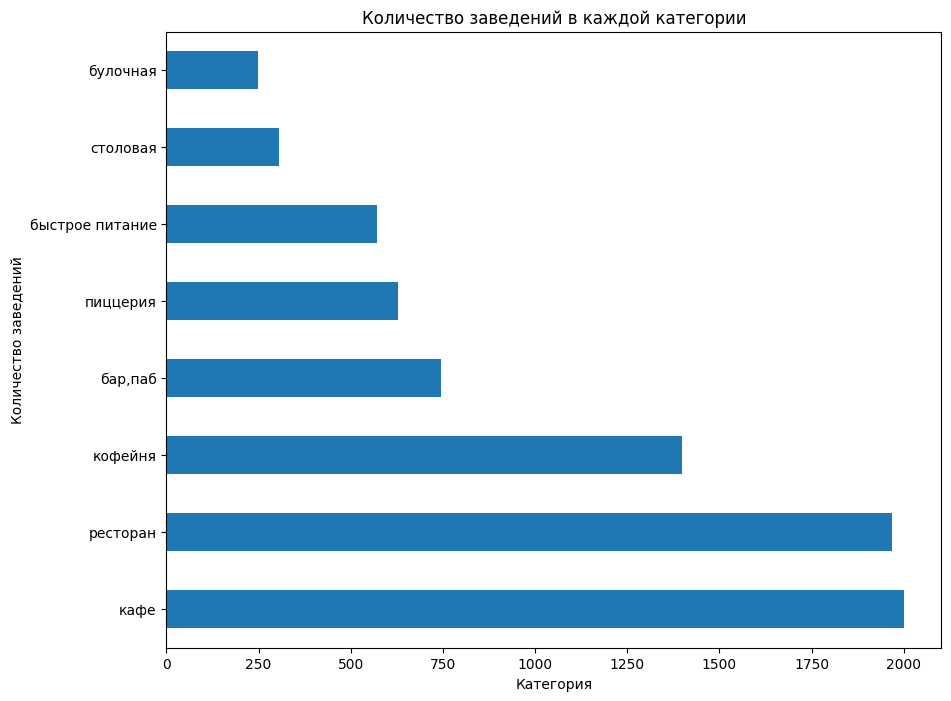

In [22]:
places['category'].value_counts().plot.barh(figsize=(10,8))
plt.title('Количество заведений в каждой категории')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.show()

Итак, согласно графику, в Москве больше всего заведений типа "кафе". Немного отстают от кафе рестораны. Тройку лидеров замыкают кофейни. Баров и пабов уже значительно меньше, более, чем в два раза меньше, чем кафе или ресторанов. Наиболее немногочисленная группа - булочные.

Теперь исследуем количество посадочных мест в заведениях по всем представленным категориям.

Немного ранее мы уже строили гистограмму распределения количества посадочных мест в зависимости от типа заведения. Она показала, что никаких закономерностей распределения для заведения разных типов нет. Еще раз проверим это утверждение, построив violinplot для большей наглядности.

In [23]:
places.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False)

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,73.5
2,быстрое питание,69.5
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


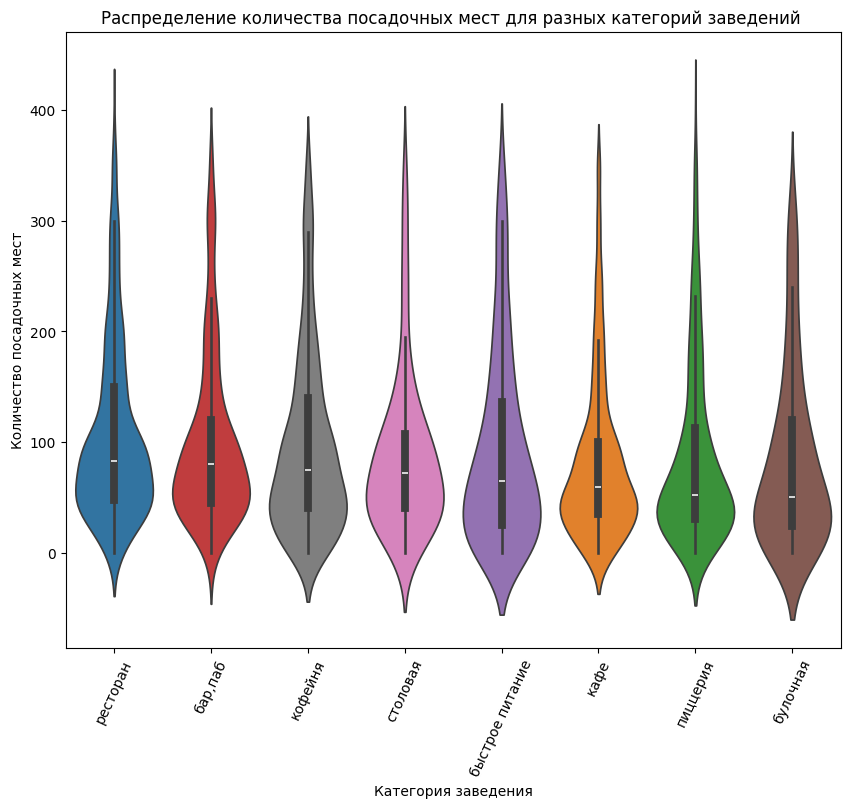

In [24]:
plt. figure(figsize=(10, 8))
sns.violinplot(data=places[places['seats']<400], x='category', y='seats', 
               order=places.groupby('category', as_index=False)['seats'].median().\
               sort_values(by='seats', ascending=False)['category'], hue='category') # построим гистограмму
# распределения количества посадочных мест в разрезе категории заведения, ограничив количество посадочных мест 400 
plt.title('Распределение количества посадочных мест для разных категорий заведений ')
plt.xlabel('Категория заведения')
plt.xticks(rotation=65)
plt.ylabel('Количество посадочных мест')
plt.show()

Визуализация с помощью violinplot также показала, что распредление посадочных мест в заведениях для разных категорий примерно одинаковое. Взаимосвязи между типом заведения и количеством мест для гостей нет. 

### 2.2 Сетевые и несетевые заведения

Следующим шагом оценим, каково соотношение сетевых и несетевых заведений в датасете. Для этого сгруппируем данные по признаку chain и посчитаем общее количество сетевых и несетевых заведений.

In [25]:
places['chain'].value_counts()

chain
0    4780
1    3087
Name: count, dtype: int64

Вспомним, что 0 - заведение несетевое, 1 - заведение сетевое. Визуализируем получившиеся значения, с помощью круговой диаграммы.

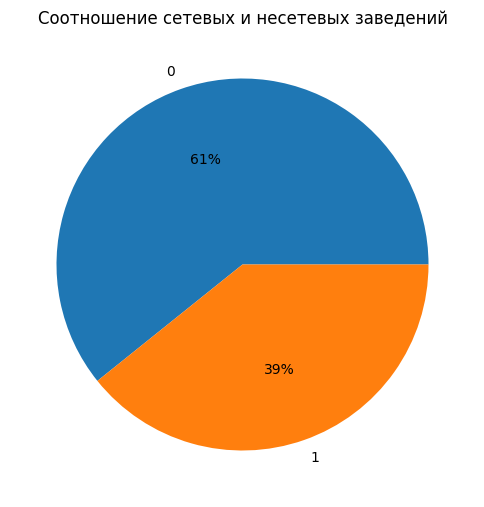

In [26]:
# задаем таблицу chain с данными о количестве сетевых и несетевых заведений
chain = places['chain'].value_counts().reset_index()

plt. figure(figsize=(6, 8))
plt.pie(chain['count'], labels = chain.index, autopct='%.0f%%')
plt.title('Соотношение сетевых и несетевых заведений')

plt.show()

Таким образом доля сетевых заведений по сравнению с несетевыми значительно выше - 61% против 39% от общего количества заведений в датасете. 

Посчитаем доли сетевых заведений в каждой категории. Для этого посчитаем среднее по столбцу chain в каждой группе:

In [27]:
places.groupby('category', as_index=False)['chain'].mean()

,category,chain
0,"бар,паб",0.211796
1,булочная,0.618474
2,быстрое питание,0.392982
3,кафе,0.355145
4,кофейня,0.510730
5,пиццерия,0.525478
6,ресторан,0.361280
7,столовая,0.277778


Доли рассчитаны. Переложим их на столбчатую диаграмму:

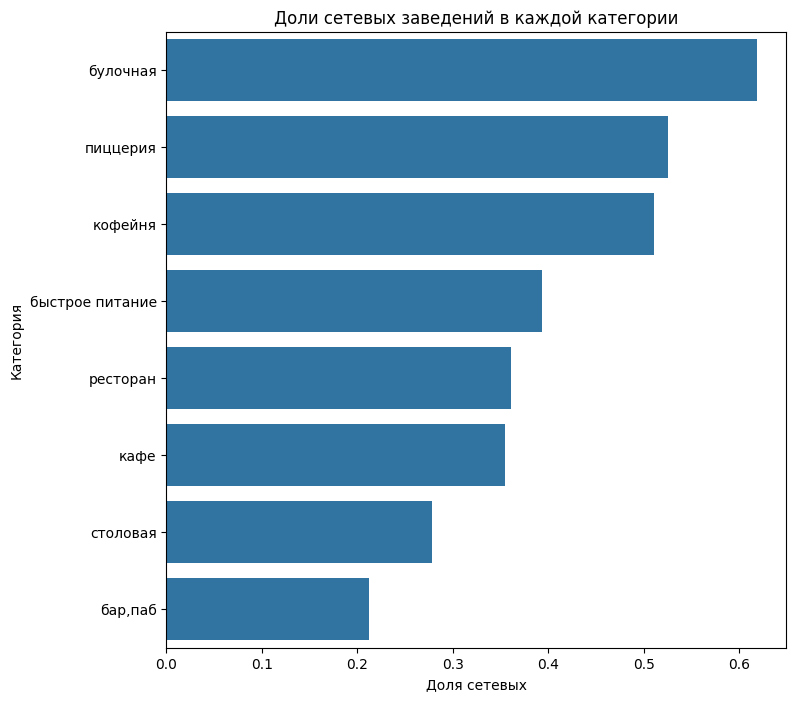

In [28]:
shares = places.groupby('category', as_index=False)['chain'].mean()

plt.figure(figsize=(8,8))
sns.barplot(data = shares, y='category', x='chain', \
            order=shares.sort_values(by='chain', ascending = False)['category'])
plt.title('Доли сетевых заведений в каждой категории')
plt.xlabel('Доля сетевых')
plt.ylabel('Категория')
plt.show()

Наибольшее количество сетевых заведений представлено в категории "булочная". Также много сетевых мест среди пиццерий и кофеен. Наименьшее количество заведений, принадлежащих к каким-либо сетям, среди баров/пабов и среди столовых. Так как столовые одна из самых малочисленных групп, можно сказать, что сетевых заведений в этой категории практически нет. 

Определим топ-15 популярных сетей в Москве. Критерий популярности - количество заведений в сети.

In [29]:
places['name'].value_counts().head(15).index 

Index(['шоколадница', 'кафе', 'домино'с пицца', 'додо пицца',
       'one price coffee', 'яндекс лавка', 'cofix', 'prime', 'кофепорт',
       'кулинарная лавка братьев караваевых', 'хинкальная', 'теремок',
       'шаурма', 'cofefest', 'буханка'],
      dtype='object', name='name')

Самой популярной сетью в Москве является "Шоколадница" - этой сети принадлежит наибольшее количество заведений в регионе. Большинство других сетей из списка также широко распространены по всей России. 
Однако, среди прочих известных сетей есть заведения с такими простыми названиями как "кафе" и "шаурма". Проверим, действительно, ли эти заведения относятся к сетевым: добавим фильтр по столбцу сhain при выводе топ-15 сетей Москв и посмотрим, как изменится результат.

In [30]:
places.loc[places['chain']==1]['name'].value_counts().head(15).index 

Index(['шоколадница', 'домино'с пицца', 'додо пицца', 'one price coffee',
       'яндекс лавка', 'cofix', 'prime', 'кофепорт',
       'кулинарная лавка братьев караваевых', 'хинкальная', 'теремок',
       'cofefest', 'буханка', 'чайхана', 'му-му'],
      dtype='object', name='name')

Заведения "кафе" и "шаурма" ушли из списка. Это говорит о том, что большинство заведений с подобными именами не являются сетевыми. Из этого можно сделать вывод, что часть данных о названии заведений потеряна. 

Посмотрим, к каким категориям относятся заведения из топ-15 популярных сетей Москвы:

In [31]:
top15 = places.loc[places['chain']==1]['name'].value_counts().head(15).index 

#сгруппируем заведения из списка топ-15 по имени и найдем наиболее часто встречающиеся значения в поле "категория"
# для этих заведений с помощью метода mode
places[places['name'].isin(top15)].groupby('name')['category'].apply(lambda x: x.mode().iloc[0])

name
cofefest                                кофейня
cofix                                   кофейня
one price coffee                        кофейня
prime                                  ресторан
буханка                                булочная
додо пицца                             пиццерия
домино'с пицца                         пиццерия
кофепорт                                кофейня
кулинарная лавка братьев караваевых        кафе
му-му                                      кафе
теремок                                ресторан
хинкальная                                 кафе
чайхана                                    кафе
шоколадница                             кофейня
яндекс лавка                           ресторан
Name: category, dtype: object

Среди топ-15 популярных сетей Москвы преобладают заведения категорий "кофейня" и "кафе". Также в рейтинге встречаются одна булочная и всего две пиццерии. 

Определим, какую долю занимает та или иная категория заведений в топ-15 самых популярных сетей Москвы. Результат визуализируем с помощью круговой диаграммы:

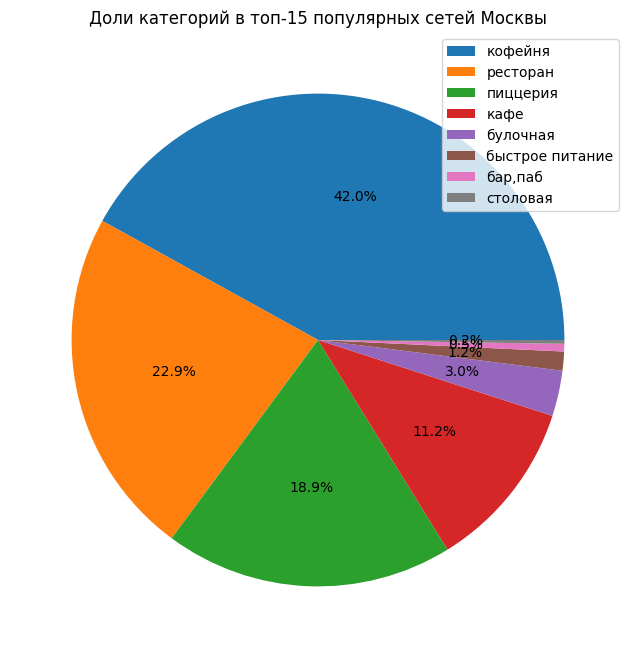

In [32]:
# определим таблицу top с данными о количестве заведений той или иной категории, 
# входящих в топ-15 популярных сетей Москвы 
top = places[places['name'].isin(top15)]['category'].value_counts().reset_index()

plt. figure(figsize=(8, 8))
plt.pie(top['count'], autopct='%1.1f%%')
plt.title('Доли категорий в топ-15 популярных сетей Москвы')
plt.legend(labels=top['category'])
plt.show()

Расчет доли различных категорий топ-15 сетях Москвы в процентах показал, что самой распространенной формой сетевых заведений является кофейня. На втором месте находится ресторан. Затем идут пиццерии и кафе.

### 2.3 География заведений общественного питания в Москве

Посмотрим, какие административные районы Москвы присутствуют в датасете. Сгруппируем данные по районам и посчитаем количество заведений разных категорий в каждом районе. Общее количество заведений выведем в столбце total.

In [33]:
tmp = places.pivot_table(index='district', values='name', columns='category', aggfunc='count')
tmp['total'] = tmp.sum(axis=1)
tmp

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Восточный административный округ,51,23,66,218,102,71,153,39,723
Западный административный округ,48,36,60,191,148,71,207,24,785
Северный административный округ,65,37,54,205,191,76,178,38,844
Северо-Восточный административный округ,56,28,79,229,157,66,174,40,829
Северо-Западный административный округ,23,12,27,86,62,40,102,17,369
Центральный административный округ,364,50,85,444,426,112,665,65,2211
Юго-Восточный административный округ,37,12,61,218,88,55,135,23,629
Юго-Западный административный округ,37,26,57,196,94,64,159,17,650
Южный административный округ,65,25,81,215,130,73,195,43,827


Всего в датасете присутствует 9 административных округов.

Построим столбцатую диаграмму, отражающую информацию о том, сколько всего заведений в каждом округе и какова доля заведений разных категорий в этом округе.

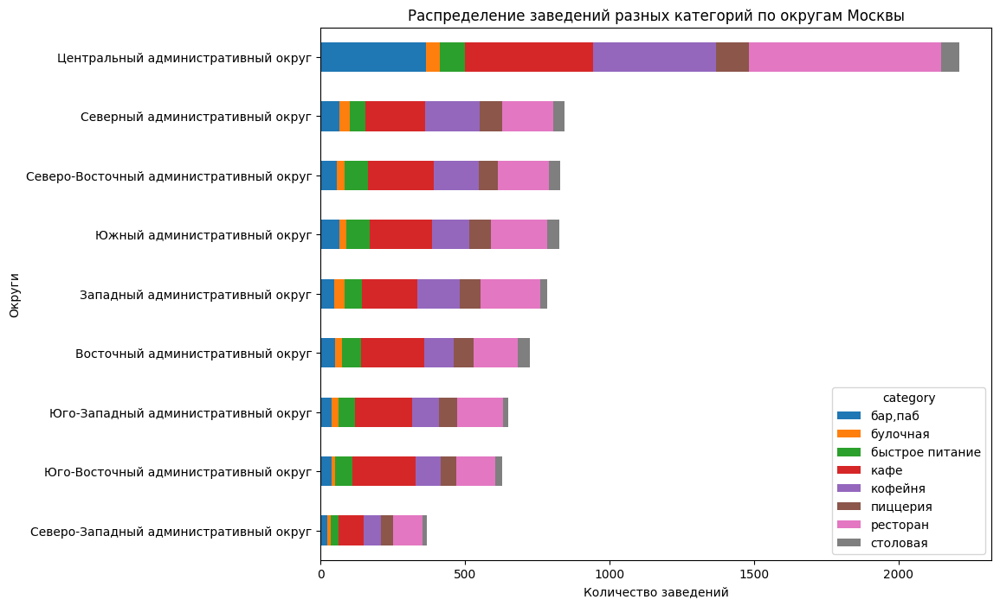

In [34]:
# еще раз зададим таблицу с данными по распределению заведений по округам
tmp = tmp.sort_values(by='total').drop(columns='total')

# строим столбчатую диаграмму с параметром stacked=True для отражения нескольких категорий в одном столбце 
tmp.plot(kind='barh', stacked=True, figsize=(10,8))
plt.title('Распределение заведений разных категорий по округам Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Округи')
plt.show()

Наибольшее количество заведений сосредоточено в Центральном административном округе Москвы. В этом районе большое количество ресторанов, кафе, а также баров и пабов. Для большинства других районов наиболее популярным типом заведений является кафе. На втором месте идут рестораны и кофейни. Бары и пабы в основном находится только в центре. Самым неосвоенным, в плане наличия заведений общественного питания, в Москве является Северо-Западный административный округ. 

Посмотрим на распределение средних рейтингов по категориям заведений. Для этого посчитаем средние рейтинги для разных типов общепита.

In [35]:
places.groupby('category')['rating'].mean()

category
бар,паб            4.394504
булочная           4.276707
быстрое питание    4.058947
кафе               4.150799
кофейня            4.275036
пиццерия           4.301433
ресторан           4.296189
столовая           4.217320
Name: rating, dtype: float64

Для большей наглядности отобразим распределение рейтингов для заведений разных категорий в виде boxplot:

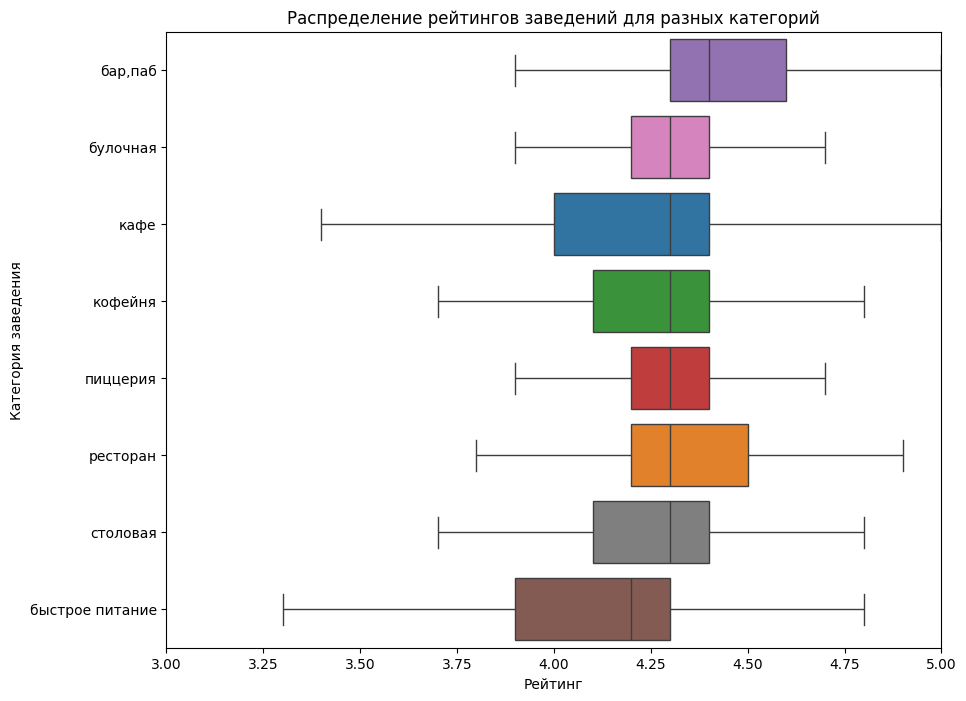

In [36]:
plt.figure(figsize=(10,8))
sns.boxplot(data = places, x='rating', y='category', fliersize=0, \
            order=places.groupby('category')['rating'].median().sort_values(ascending = False).index, hue='category')
plt.title('Распределение рейтингов заведений для разных категорий')
plt.xlabel('Рейтинг')
plt.ylabel('Категория заведения')
plt.xlim([3,5]);

Средние рейтинги для разных типов заведений отличаются незначительно. Все они расположены в промежутке между 4 и 4,5. Самый высокий средний рейтинг у баров и пабов. Одинаковый средний рейтинг у пиццерий, кофеен, ресторанов, булочных и кафе. Самый низкий средний рейтинг у заведений быстрого питания. 

Самый большой разброс по оценкам имеют кафе и заведения быстрого питания.

Теперь рассчитаем средний рейтинг заведений в каждом районе:

In [37]:
places.groupby('district', as_index=False)['rating'].mean().sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.379285
2,Северный административный округ,4.254976
4,Северо-Западный административный округ,4.237398
1,Западный административный округ,4.194140
7,Юго-Западный административный округ,4.191077
0,Восточный административный округ,4.189212
8,Южный административный округ,4.188634
3,Северо-Восточный административный округ,4.160314
6,Юго-Восточный административный округ,4.124324


Значения снова очень близки друг к другу. Для большей наглядности перенесем эту информацию на фоновую картограмму (хороплет):

In [38]:
# загружаем файл с границами районов из датасета

districts = 'admin_level_geomap.geojson'
    
# задаем широту и долготу Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# сохраним данные о средним рейтингах заведений по районам в отдельный датафрейм
places_rating = places.groupby('district', as_index=False)['rating'].mean()

# создаём хороплет и добавляем его на карту
Choropleth(
    geo_data=districts,
    data=places_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний рейтинг заведений в Центральном административном округе. Второе место делят Северный и Северо-Западный административные округи. Самый низкий средний рейтинг заведений у Юго-Восточного и Северо-Восточного административных округов. У остальных районов средний рейтинг примерно одинаковый.

Отобразим все заведения датасета и их рейтинг на карте с помощью кластеров.

In [39]:
# повторно задаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

На карте с кластерами сразу бросается в глаза, что наибольшая плотность объектов общепита наблюдается в центре. Кроме того, большое количество объектов общепита находится на западе и северо-западе города. Заведений на востоке и юго-востоке значительно меньше.

Найдем топ-15 улиц по количеству заведений.

In [40]:
places['street'].value_counts().head(15)

street
проспект мира             175
профсоюзная улица         115
проспект вернадского      101
ленинский проспект         99
ленинградский проспект     90
дмитровское шоссе          86
каширское шоссе            71
варшавское шоссе           68
ленинградское шоссе        67
люблинская улица           56
кутузовский проспект       53
улица вавилова             52
мкад                       50
пятницкая улица            48
улица миклухо-маклая       46
Name: count, dtype: int64

Самое большое сосредоточение заведений общественного питания наблюдается на проспекте Мира. Также очень популярными местами являются Профсоюзная улица и Проспект Вернадского.

Построим график распределения количества заведений и их категорий по этим улицам:

In [41]:
top_streets = places['street'].value_counts().head(15).reset_index()
top_streets

,street,count
0,проспект мира,175
1,профсоюзная улица,115
2,проспект вернадского,101
3,ленинский проспект,99
4,ленинградский проспект,90
5,дмитровское шоссе,86
6,каширское шоссе,71
7,варшавское шоссе,68
8,ленинградское шоссе,67
9,люблинская улица,56


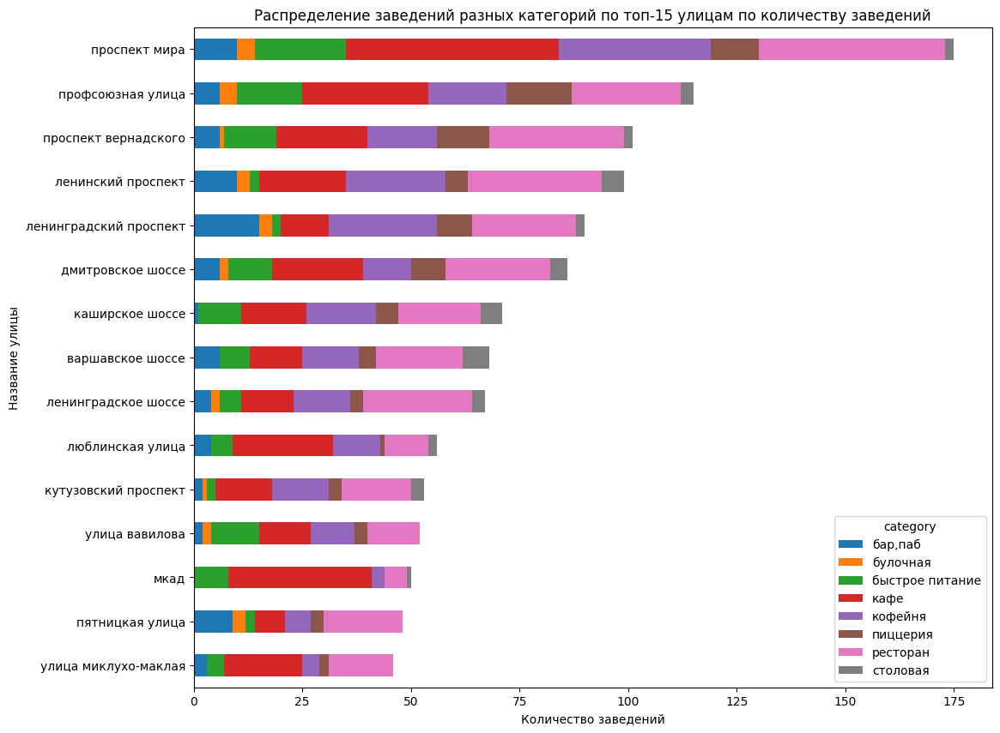

In [42]:
# задаем таблицу с топ-15 улицами 
top_streets = places['street'].value_counts().head(15).reset_index()

# создаем сводную таблицу с расчетом количества заведений по категориям для каждой улицы из топ-15
tmp = (
    places
        [places['street'].isin(top_streets['street'])]
        .pivot_table(index='street', values='name', columns='category', aggfunc='count')
        .assign(total=lambda x: x.sum(axis=1))
        .sort_values(by='total')
        .drop(columns='total')
)

# строим столбчатую диаграмму с параметром stacked=True для отражения нескольких категорий в одном столбце 
tmp.plot(kind='barh', stacked=True, figsize=(12,10))
plt.title('Распределение заведений разных категорий по топ-15 улицам по количеству заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Название улицы')
plt.show()

На самой популярной улице - проспекте Мира, самые многочисленные категории рестораны и кафе. На втором месте находятся кофейни. В целом, кафе и рестораны преобладают на всех улицах из топ-15. Самые малочисленные категории на всех улицах из топ-15 столовые и булочные. Эти категории присутствуют даже не на всех улицах.

Найдем улицы, на которых находится только один объект общепита. Посмотрим, что это за заведения.

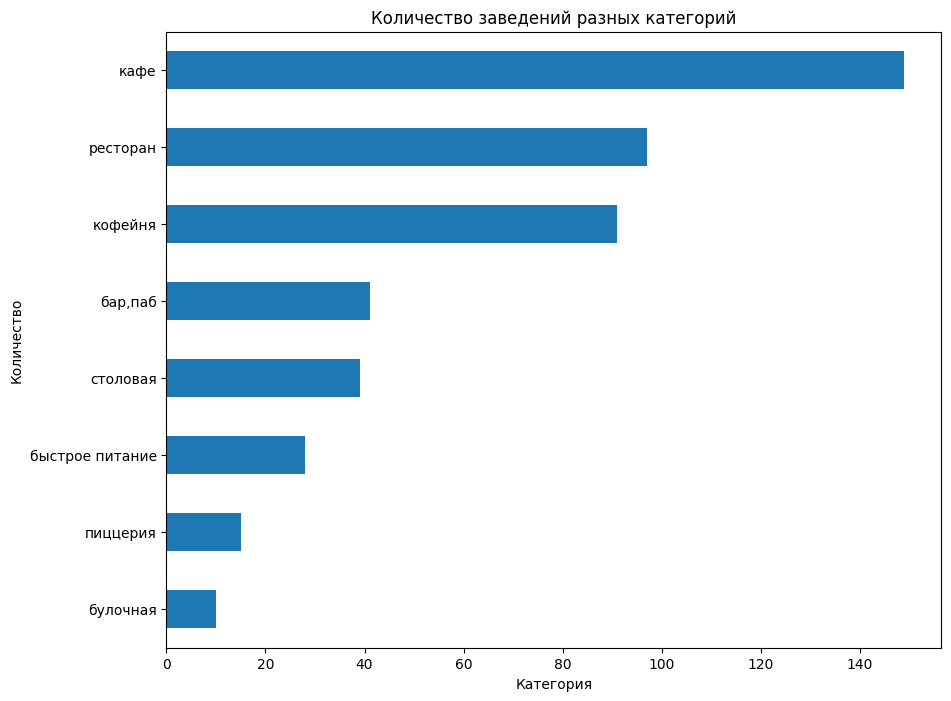

In [43]:
# задаем таблицу с количеством заведений на улице
street_places = places.groupby('street', as_index=False)['name'].count()

# выбираем строки датасета с данными о заведениях на улицах с одним объектом общепита
tmp = places[places['street'].isin(street_places[street_places['name']==1]['street'])]

# строим столбчатую диаграмму, отобразив количество заведений разных категорий на этих улицах

tmp.groupby('category')['name'].count().sort_values().plot(kind='barh', figsize=(10,8))

plt.title('Количество заведений разных категорий')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.show()

Итак, даже если на улице всего одно заведение, в большинстве случаев это кафе, ресторан или кофейня. Реже всего на таких улицах можно встретить булочную и пиццерию. Тенденции такие же, как для топ-15 улиц и для административных округов.

С помощью кластеров, посмотрим на улицы с одним заведением общепита на карте.

In [44]:
# повторно задаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['street']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
tmp.apply(create_clusters, axis=1)

# выводим карту
m

В основном улицы с одним заведением находятся в центре города. Как правило, это небольшие переулки,тупики и проезды, а не главные улицы.

Проанализируем цены в разных административных районах. Для этого посчитаем медианные средние чеки для всех округов и на основании этих данных построим фоновую картограмму (хороплет).

In [45]:
# рассчитываем медианный средний чек для каждого округа
places.groupby('district', as_index=False)['middle_avg_bill'].median()

# повторно задаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет и добавляем его на карту
Choropleth(
    geo_data=districts,
    data=places.groupby('district', as_index=False)['middle_avg_bill'].median(),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    legend_name='Медианный средний чек заказа заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий медианный средний чек наблюдается в Центральном и Западном административном округе. Затем идут Северный и Северо-Западный округ. Самые низкие цены в Южном, Юго-Восточном и Северо-Восточном округах.

Таким образом более высокий средний чек характерен для центра города и ближайших к нему районам на северо-западе Москвы.

### Вывод

В данных представлена информация о 7 категориях заведений общественного питания: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная. Наиболее многочисленные категории: кафе, рестораны, кофейни. Хуже всего представлены в датасете булочные и столовые.

Взаимосвязи между типом заведения и количеством мест для гостей нет.

Наибольшее количество сетевых заведений представлено в категории "булочная". Также много сетевых мест среди пиццерий и кофеен. Самой популярной сетью в Москве является "Шоколадница", относящаяся к катеогрии кофеен. Среди топ-15 популярных сетей Москвы преобладают кофейни и рестораны. 

Всего в датасете присутствует 9 административных округов.

Наибольшее количество заведений сосредоточено в Центральном административном округе Москвы. Там преобладают рестораны, кафе, а также бары и пабы. Наличие баров и пабов больше характерно для центра. Для большинства других районов популярными категориями заведений являются кафе, рестораны и кофейни. Меньше всего заведений общественного питания в Северо-Западном административном округе.

Самый высокий средний рейтинг у баров и пабов. Одинаковый средний рейтинг у пиццерий, кофеен, ресторанов, булочных и кафе. Самый низкий средний рейтинг у заведений быстрого питания.

Самый высокий средний рейтинг заведений в Центральном административном округе. Самый низкий средний рейтинг заведений у Юго-Восточного и Северо-Восточного административных округов. У остальных районов средний рейтинг примерно одинаковый.

Самое большое сосредоточение заведений общественного питания наблюдается на проспекте Мира. Также очень популярными местами являются Профсоюзная улица и Проспект Вернадского.

Наиболее популярные заведения на улицах с самым большим количеством объектов общепита кафе и рестораны. Самые малочисленные категории на всех улицах из топ-15: столовые и булочные. 

Даже если на улице всего одно заведение, в большинстве случаев это кафе, ресторан или кофейня. 

Самый высокий медианный средний чек наблюдается в Центральном и Западном административном округе. Самые низкие цены в Южном, Юго-Восточном и Северо-Восточном округах.

## 3. Анализ рынка кофеен в Москве

### 3.1 Исследование рынка кофеен

Выберем из исходного датасета фрагмент с данными только о кофейнях:

In [46]:
places[places['category']=='кофейня'].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False


Посчитаем, сколько всего заведений в новом датасете.

In [47]:
places.loc[places['category']=='кофейня', 'name'].count()

1398

Проведем проверку данных на наличие пропусков:

In [48]:
places[places['category']=='кофейня'].isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                 893
avg_bill              678
middle_avg_bill      1198
middle_coffee_cup     878
chain                   0
seats                 653
street                  0
is_24_7                 0
dtype: int64

Пропуски присутствуют в колонках price, avg_bill, middle_avg_bill, middle_coffee_cup и seats. Наиболее критичным для нашего дальнейшего исследования являются пропуски в столбце middle_coffee_cup. Однако данные в этом столбце определяются информацией из столбца avg_bill, в котором также большое количество пропусков. Поэтому можно сказать, что в основном они обусловлены отсутствием информации о средней стоимости заказа данных заведений.

Посчитаем долю кофеен среди всех заведений в Москве:

In [49]:
(places.loc[places['category']=='кофейня', 'name'].count()/len(places)*100).round(2)

17.77

Всего в датасете содержатся данные об **1398** кофейнях. Что составляет **17.77%** среди всех заведений общественного питания в Москве.

Посмотрим, в каких районах больше всего кофеен. Для этого снова воспользуемся столбчатой диаграммой.

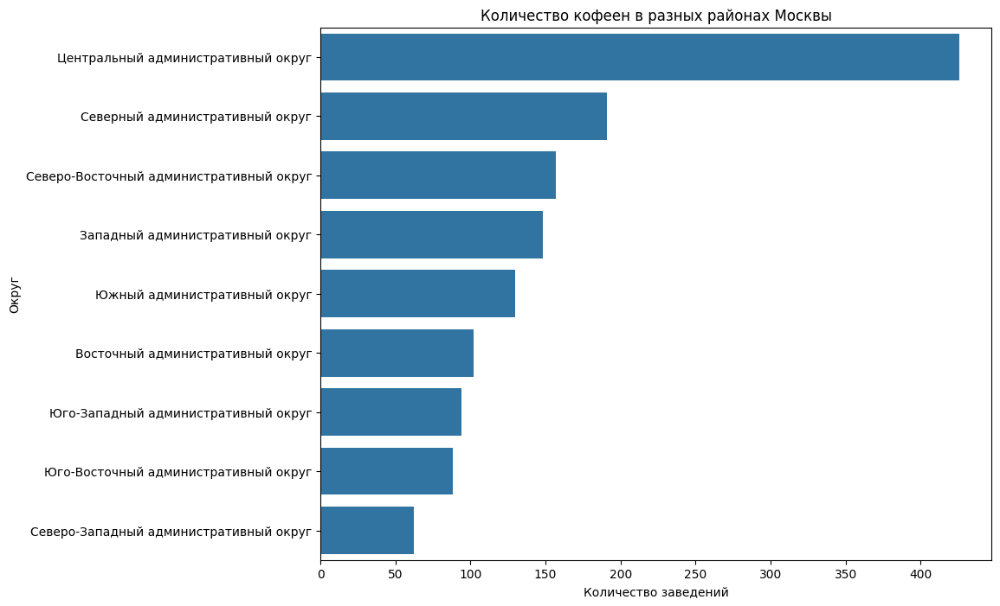

In [50]:
# рассчитываем количество кофеен в каждом округе
coffee_shops = places[places['category']=='кофейня'].groupby('district', as_index=False)['name'].count()

plt.figure(figsize=(10,8))
sns.barplot(data = coffee_shops, y='district', x='name',
            order= coffee_shops.sort_values(by='name', ascending=False)['district'])
plt.title('Количество кофеен в разных районах Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Округ')
plt.show()

Наибольшее количество кофеен сосредоточено в центре города. На втром месте, со значительным отрывом  Северный административный округ. Меньше всего кофеен расположено в Северо-Западном административном округе.

Узнаем, есть ли круглосуточные кофейни в датасете:

In [51]:
# считаем количество круглосуточных кофеен
display(places.loc[(places['category']=='кофейня')&(places['is_24_7']==1), 'name'].count())

# считаем их долю в общем количестве кофеен
(places.loc[(places['category']=='кофейня')&(places['is_24_7']==1), 'name'].count()/\
        len(places[places['category']=='кофейня'])*100).round(2)

59

4.22

Всего **59** кофеен из общего количества являются круглосуточными. Что составляет около **4.22%** от общего количества кофеен.

Определим средний рейтинг кофеен по районам Москвы.

In [52]:
places[places['category']=='кофейня'].groupby('district', as_index=False)['rating'].mean()

,district,rating
0,Восточный административный округ,4.276471
1,Западный административный округ,4.191892
2,Северный административный округ,4.292147
3,Северо-Восточный административный округ,4.214013
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336150
6,Юго-Восточный административный округ,4.217045
7,Юго-Западный административный округ,4.274468
8,Южный административный округ,4.232308


Для большей наглядности перенесем информацию на фоновую картограмму (хороплет).

In [53]:
# повторно задаем карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет и добавляем его на карту
Choropleth(
    geo_data=districts,
    data=places[places['category']=='кофейня'].groupby('district', as_index=False)['rating'].mean(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.7,
    legend_name='Рейтинги кофеен по районам',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги кофеен снова в центре и на северо-западе города. Самые низкие рейтинге в Северо-Восточном и в Западном округе.

Посмотрим на распределение средней стоимости чашки капучино. Для этого воспользуемся графиком типа boxplot.

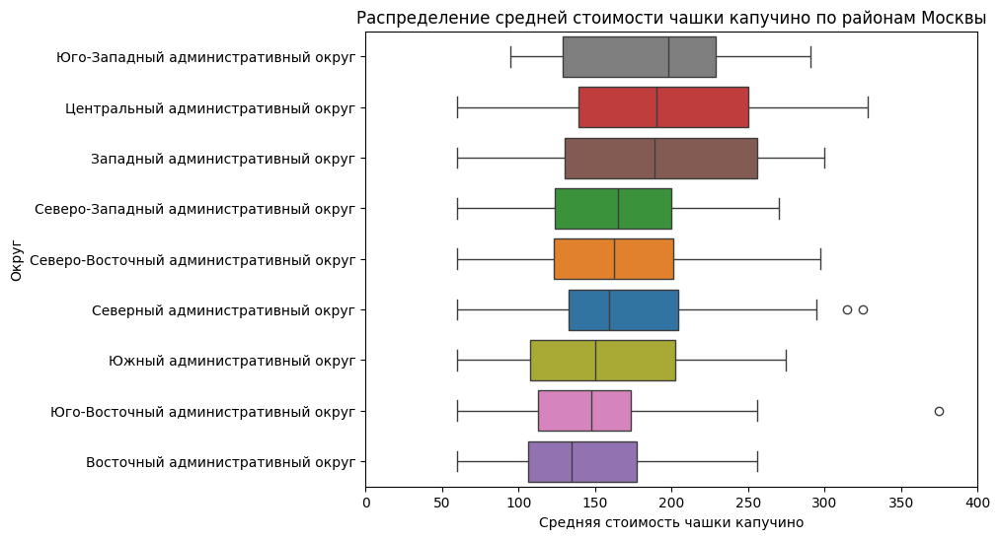

In [54]:
plt.figure(figsize=(8,6))
sns.boxplot(data = places[places['category']=='кофейня'], x='middle_coffee_cup', y='district',
            order=places[places['category']=='кофейня'].groupby('district')['middle_coffee_cup']\
            .median().sort_values(ascending=False).index, hue='district')
plt.title('Распределение средней стоимости чашки капучино по районам Москвы')
plt.xlim([0,400])
plt.xlabel('Средняя стоимость чашки капучино')
plt.ylabel('Округ')
plt.show()

В среднем стоимости чашки капучино в московских кофейнях колеблется между 150-200 рублями. Самая высокая медианная цена чашки кофе наблюдается в Юго-Западном административном округе, за ним идут Центральный и Западный административные округи. Есть выбросы по стоимости в Юго-Восточном и Северном округах, так в Юго-Восточном округе средняя стоимость чашки кофе могла доходить до ~380 рублей. 

### 3.2 Вывод:

Всего в Москве 1398 кофеен, что составляет 17.77% от общего количества заведений общественного питания в Москве. Наибольшее количество кофеен сосредоточено в Центральном районе Москвы. Хуже всего кофейни представлены в Северо-Западном административном округе.

Среди кофеен также имеются круглосуточные. Всего таких заведений 59, что составляет около 4.22% от общего количества кофеен. 

Кофейни с самыми высокими рейтингами располагаются в основном в Центральном и на Северо-Западном округах. Самые низкие рейтинги кофеен в Северо-Восточном и в Западном округе.

Средняя стоимость чашки капучино в московских кофейнях колеблется между 150-200 рублями. Самая высокая средняя цена чашки кофе наблюдается в Юго-Западном административном округе, за ним идут Центральный и Западный административные округи. 

Таким образом, Центральный административный округ имеет наибольшее количество кофеен как в абсолютных значениях, так и в относительных. Также, кофейни в этом округе имеют наибольший средний рейтинг. Скорее всего, это говорит как о высоком спросе на заведения такого типа в центральном районе, так и о высокой конкуренции.  Однако, принимая во внимание тот факт, что конкуренция не отпугивает заказчика, а также, что ориентиром для инвесторов является кофейня Central Рerk из сериала "Друзья", Центральный административный округ является наиболее подходящим местом для открытия кофейни. 

Для более точной оценки рентабельности локации, рекомендовано провести дополнительное исследование стоимости аренды и зарплат, а также прибылей заведений в данном районе.

## Презентация

Презентация с результатами исследования сохранена по ссылке: 
https://disk.yandex.ru/i/t30R-HcgG3L0mQ